<a href="https://colab.research.google.com/github/ZUHAIR-5421342/Computer-Vision/blob/main/Copy_of_DS473.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installing Dependencies

In [ ]:
!pip install ultralytics
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 43.0 MB/s eta 0:00:00


# Imports

In [ ]:
from torchvision.datasets import VOCDetection
from torchvision import transforms
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
import torchvision

from torchmetrics.detection.mean_ap import MeanAveragePrecision

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau

from ultralytics import YOLO

from sklearn.metrics import precision_score, recall_score, classification_report, accuracy_score, precision_score, recall_score, hamming_loss
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MultiLabelBinarizer

import matplotlib.pyplot as plt
import matplotlib.patches as patches

import seaborn as sns

from tqdm import tqdm

import numpy as np
import pandas as pd

import os
import xml.etree.ElementTree as ET
import shutil
import yaml
import random

import time

import warnings

warnings.simplefilter('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Loading Data

In [ ]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Ensures all images are 256*256
    transforms.ToTensor(),
])

label_dict = {
    'horse': 0,
    'bottle': 1,
    'dog': 2,
    'tvmonitor': 3,
    'car': 4,
    'aeroplane': 5,
    'bicycle': 6,
    'person': 7,
    'train': 8,
    'cat': 9,
    'chair': 10,
    'bird': 11,
    'motorbike': 12,
    'sofa': 13,
    'boat': 14,
    'pottedplant': 15,
    'bus': 16,
    'cow': 17,
    'diningtable': 18,
    'sheep': 19
}

target_dict = dict(zip(label_dict.values(), label_dict.keys()))

# Instantiate the dataset
train_dataset = VOCDetection(root='voc_dataset', year='2012', image_set='train', transform=transform, download=True)
test_dataset = VOCDetection(root='voc_dataset', year='2012', image_set='val', transform=transform, download=True)

100%|██████████| 2.00G/2.00G [01:44<00:00, 19.1MB/s]


Extracting voc_dataset/VOCtrainval_11-May-2012.tar to voc_dataset
Using downloaded and verified file: voc_dataset/VOCtrainval_11-May-2012.tar
Extracting voc_dataset/VOCtrainval_11-May-2012.tar to voc_dataset


# Creating Data Loaders for Training and Testing

In [ ]:
def parse_voc_annotation(annotation):

    try:
        img_width = float(annotation['annotation']['size']['width'])
    except:
        img_width = 256
    try:
        img_height = float(annotation['annotation']['size']['height'])
    except:
        img_height = 256

    objects = annotation['annotation']['object']

    if not isinstance(objects, list):
        objects = [objects]

    boxes = []
    labels = []

    for obj in objects:

        xmin = int(obj['bndbox']['xmin'])
        xmin = (xmin/img_width)*256

        ymin = int(obj['bndbox']['ymin'])
        ymin = (ymin/img_height)*256

        xmax = int(obj['bndbox']['xmax'])
        xmax = (xmax/img_width)*256

        ymax = int(obj['bndbox']['ymax'])
        ymax = (ymax/img_height)*256

        boxes.append([xmin, ymin, xmax, ymax])
        labels.append(label_dict[obj['name']])

    target = {
        'boxes': torch.tensor(boxes, dtype=torch.float32),
        'labels': torch.tensor([label for label in labels], dtype=torch.int64)
    }
    return target

In [ ]:
def custom_collate_fn(batch):

    images = torch.stack([item[0] for item in batch])
    images = np.transpose(images, (0, 2, 3, 1))

    targets = np.array([parse_voc_annotation(item[1]) for item in batch])

    return images, targets

train_loader = DataLoader(
    train_dataset,
    batch_size=8,
    shuffle=True,
    collate_fn=custom_collate_fn,
    drop_last=True,
    num_workers=4,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=8,
    shuffle=False,
    collate_fn=custom_collate_fn,
    drop_last=True,
    num_workers=4,
    pin_memory=True
)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


# Checking number of images available per class for our training data

In [ ]:
all_labels = []
for images, targets in tqdm(train_loader):
    for target in targets:
        for i in target['labels']:
            all_labels.append(i.item())

100%|██████████| 714/714 [00:51<00:00, 13.91it/s]


In [ ]:
class_freq = dict([(target_dict[i], all_labels.count(i)) for i in set(all_labels)])

Text(0.5, 1.0, 'Class Frequency in Training Data')

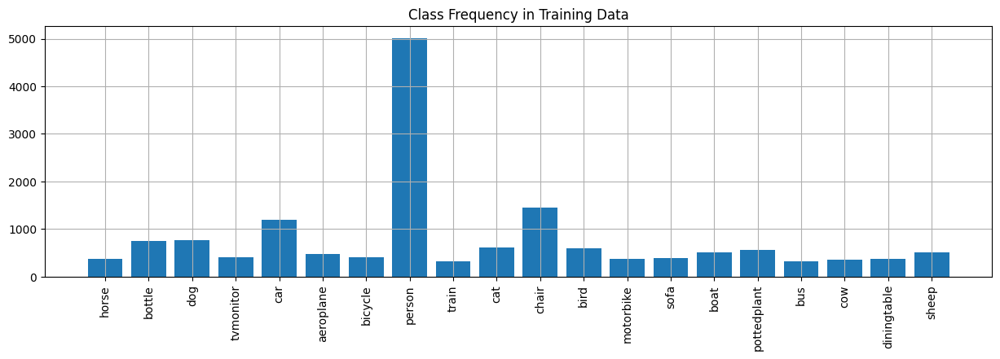

In [ ]:
plt.figure(figsize=(15, 4))
plt.bar(class_freq.keys(), class_freq.values())
plt.grid()
plt.xticks(rotation=90)
plt.title("Class Frequency in Training Data")

# Checking out random training images in our dataset

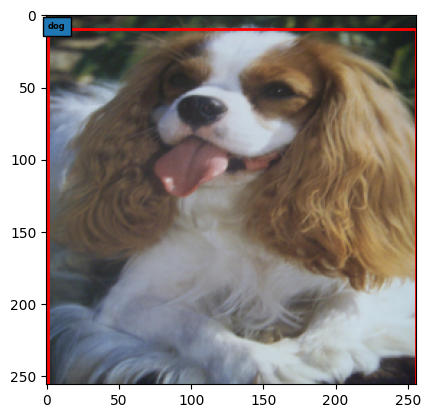

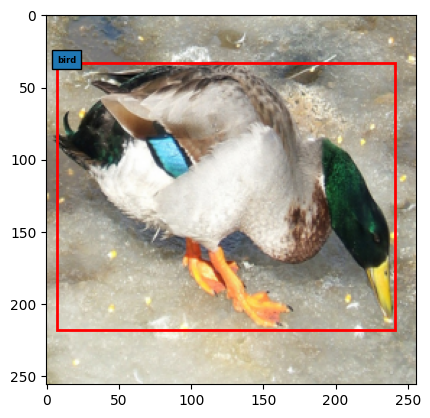

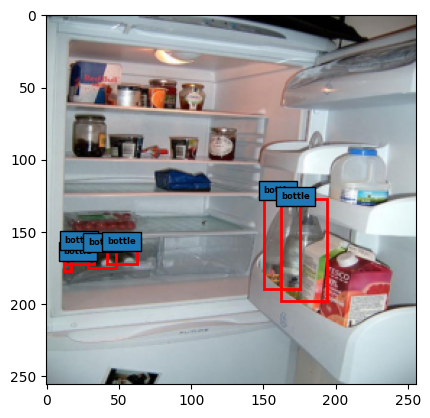

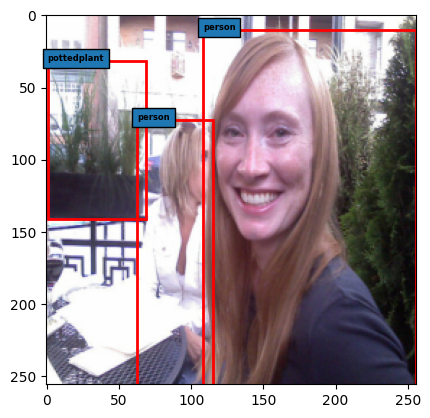

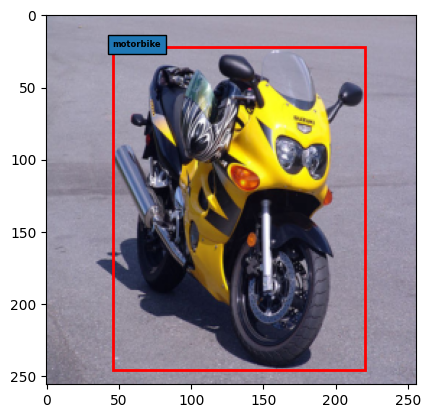

...

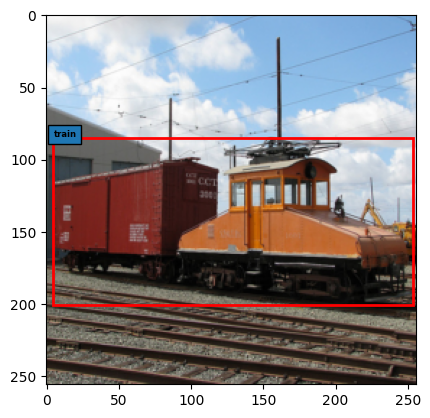

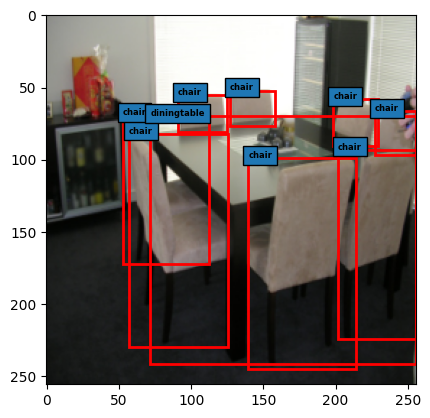

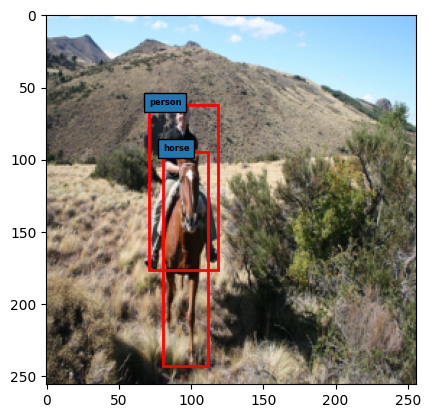

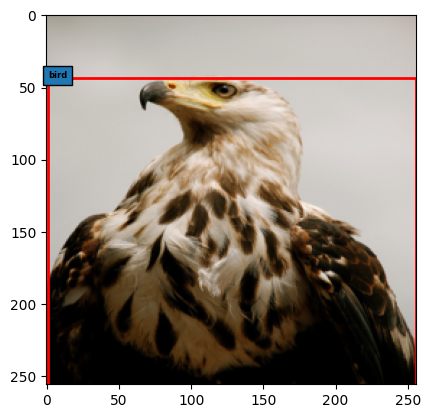

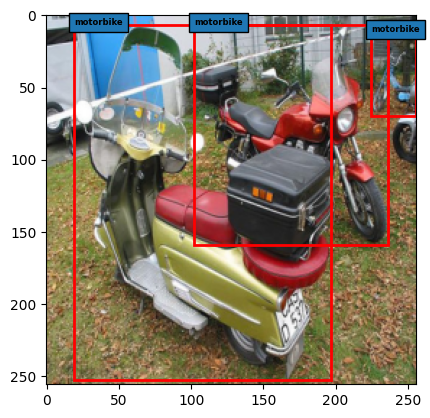

In [ ]:
num_batches = 0

for images, targets in train_loader:
    img = images[0]
    target = targets[0]
    fig, ax = plt.subplots()
    ax.imshow(img)
    bxs = target['boxes']
    lbls = target['labels']
    for k in range(len(bxs)):
        bx = bxs[k]
        lbl = target_dict[lbls[k].item()]
        rect = patches.Rectangle((bx[0], bx[1]), bx[2]-bx[0], bx[3]-bx[1], linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.annotate(lbl, (bx[0], bx[1]-5), color='black', weight='bold',
                        fontsize=6, ha='left', va='top', bbox=dict(boxstyle='square,pad=.6'))
    plt.show()

    if num_batches == 10:
      break
    else:
      num_batches += 1

# CNN

## Data Pre-processing for CNN

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
class SingleObjectVOCDetectionForCNN(VOCDetection):
    def __init__(self, root, year='2012', image_set='train', transforms=None, target_transform=None, download=False):
        super().__init__(root, year=year, image_set=image_set, transforms=None, target_transform=target_transform, download=download)
        self.image_transforms = transforms

    def __getitem__(self, index):
        image, target = super().__getitem__(index)
        # Check if there's only one object by the length of 'annotation'['object'] list
        if isinstance(target["annotation"]["object"], list):
            if len(target["annotation"]["object"]) != 1:
                return None, None  # Skip multi-object images
        else:
            return None, None  # Skip if no valid object data

        # Apply transformations to the image only
        if self.image_transforms:
            image = self.image_transforms(image)

        return image, target

In [ ]:
def collate_single_object(batch):

    batch = [(img, tgt) for img, tgt in batch if img != None]

    images = torch.stack([item[0] for item in batch])
    images = np.transpose(images, (0, 2, 3, 1))

    targets = np.array([parse_voc_annotation(item[1])['labels'][0] for item in batch])

    return images, targets

# Load the filtered dataset
train_dataset_for_cnn = SingleObjectVOCDetectionForCNN(root="voc_dataset", year='2012', image_set='train', download=False, transforms=transform)
train_dataloader_for_cnn = DataLoader(train_dataset_for_cnn, batch_size=16, collate_fn=collate_single_object)

test_dataset_for_cnn = SingleObjectVOCDetectionForCNN(root="voc_dataset", year='2012', image_set='val', download=False, transforms=transform)
test_dataloader_for_cnn = DataLoader(test_dataset_for_cnn, batch_size=16, collate_fn=collate_single_object)

## Defining CNN model

In [ ]:
class MyCNNModel(nn.Module):
    def __init__(self, num_classes=20):
        super(MyCNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)

        self.fc1 = nn.Linear(128 * 32 * 32, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        # Flatten the tensor
        x = x.view(x.size(0), -1)

        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

## Initiating CNN Model

In [ ]:
model = MyCNNModel(num_classes=20)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

In [ ]:
model.to(device)

MyCNNModel(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=131072, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=20, bias=True)
)

## Training CNN Model

In [ ]:
num_epochs = 10

for epoch in range(num_epochs):

    running_loss = 0.0
    correct = 0
    total = 0

    model.train()

    for images, labels in tqdm(train_dataloader_for_cnn):

        images = images.reshape((images.shape[0], 3, 256, 256))
        labels = torch.from_numpy(to_categorical(labels, num_classes=20))

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Statistics
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels.argmax(dim=1)).sum().item()

    scheduler.step()

    print(f"\nEpoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}, "
              f"Accuracy: {100 * correct / total:.2f}%")

100%|██████████| 358/358 [00:53<00:00,  6.68it/s]



Epoch [1/10], Loss: 1.3666, Accuracy: 18.95%


100%|██████████| 358/358 [00:49<00:00,  7.20it/s]



Epoch [2/10], Loss: 1.3202, Accuracy: 21.98%


100%|██████████| 358/358 [00:40<00:00,  8.79it/s]



Epoch [3/10], Loss: 1.2942, Accuracy: 22.67%


100%|██████████| 358/358 [00:41<00:00,  8.56it/s]



Epoch [4/10], Loss: 1.2768, Accuracy: 24.86%


100%|██████████| 358/358 [00:43<00:00,  8.26it/s]



Epoch [5/10], Loss: 1.2536, Accuracy: 25.26%


100%|██████████| 358/358 [00:43<00:00,  8.29it/s]



Epoch [6/10], Loss: 1.2244, Accuracy: 27.61%


100%|██████████| 358/358 [00:43<00:00,  8.24it/s]



Epoch [7/10], Loss: 1.1839, Accuracy: 30.24%


100%|██████████| 358/358 [00:44<00:00,  8.02it/s]



Epoch [8/10], Loss: 1.1316, Accuracy: 34.01%


100%|██████████| 358/358 [00:52<00:00,  6.87it/s]



Epoch [9/10], Loss: 1.0643, Accuracy: 39.19%


100%|██████████| 358/358 [00:42<00:00,  8.49it/s]


Epoch [10/10], Loss: 0.9805, Accuracy: 46.40%


## Saving CNN Model for for future use

In [ ]:
torch.save(model, "simplecnn.pl")

## Loading back the CNN Model (if not re-training)

In [ ]:
# Loading back the model

torch.serialization.add_safe_globals([MyCNNModel])
torch.serialization.add_safe_globals([set])
model = torch.load("simplecnn.pl", map_location=torch.device('cpu'))

## Analyzing results mertrics for CNN Model

In [ ]:
org_labels = []
predictions = []
images_all = []

model.eval()
for imgs, lbls in tqdm(test_dataloader_for_cnn):
    images = imgs.reshape((imgs.shape[0], 3, 256, 256))
    org_labels.append(lbls)

    for img in imgs:
      images_all.append(img)

    images = images.to(device)

    with torch.no_grad():
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        predictions.append(predicted)

100%|██████████| 364/364 [00:39<00:00,  9.29it/s]


In [ ]:
org_labels_all = np.concatenate(org_labels).ravel().tolist()
predictions_all = [i.item() for j in predictions for i in j]

In [ ]:
org_labels_cat = to_categorical(org_labels_all, num_classes=20)
pred_labels_cat = to_categorical(predictions_all, num_classes=20)

In [ ]:
precision = precision_score(org_labels_cat, pred_labels_cat, average='weighted', zero_division=np.nan)
recall = recall_score(org_labels_cat, pred_labels_cat, average='weighted', zero_division=np.nan)
accuracy = accuracy_score(org_labels_cat, pred_labels_cat)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

Accuracy: 0.1802
Precision: 0.1604
Recall: 0.1802


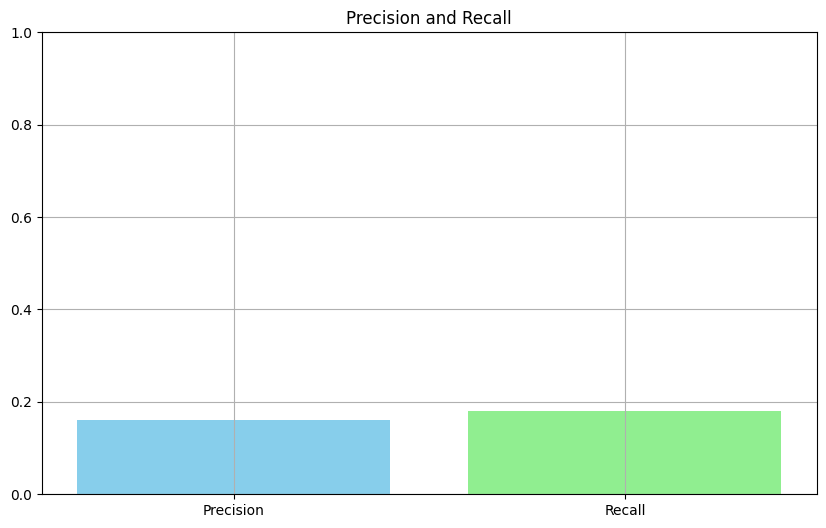

In [ ]:
plt.figure(figsize=(10, 6))

# Precision and Recall
plt.bar(['Precision', 'Recall'], [precision, recall], color=['skyblue', 'lightgreen'])
plt.title('Precision and Recall')
plt.grid()
plt.ylim(0, 1)

plt.show()

In [ ]:
start_time = time.time()

img = images_all[0].reshape((1, 3, 256, 256))
with torch.no_grad():  # No gradient calculation
    try:
        outputs = model(img)
    except:
        img = img.to(device)
        outputs = model(img)
    _, predicted = torch.max(outputs, 1)
    prediction = to_categorical(predicted.item(), num_classes=20)

end_time = time.time()
inference_time = end_time - start_time

print(f"Inference Time: {round(inference_time, 2)} sec per image")

Inference Time: 0.1 sec per image


In [ ]:
model_size = os.path.getsize("simplecnn.pl")

# Convert size to MB (1 MB = 1024 * 1024 bytes)
model_size_mb = model_size / (1024 * 1024)

# Print the size of the model
print(f"The size of the model is: {model_size_mb:.2f} MB")

The size of the model is: 128.38 MB


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


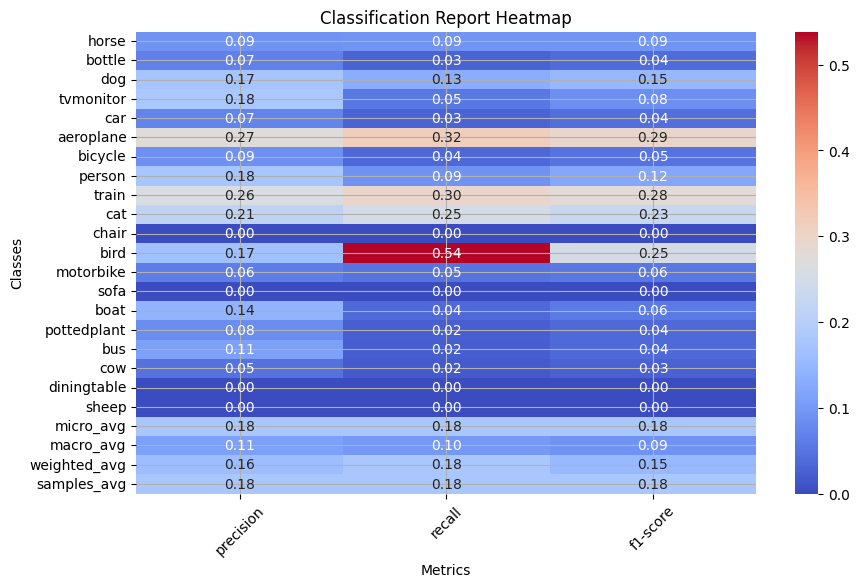

In [ ]:
cr = classification_report(org_labels_cat, pred_labels_cat,  output_dict=True)

report_df = pd.DataFrame(cr).transpose()

report_df.index = list(label_dict.keys()) + ['micro_avg', 'macro_avg', 'weighted_avg', 'samples_avg']

# Plotting
plt.figure(figsize=(10, 6))
sns.heatmap(report_df[['precision', 'recall', 'f1-score']], annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title('Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.xticks(rotation=45)
plt.grid()
plt.yticks(rotation=0)
plt.show()

<Axes: >

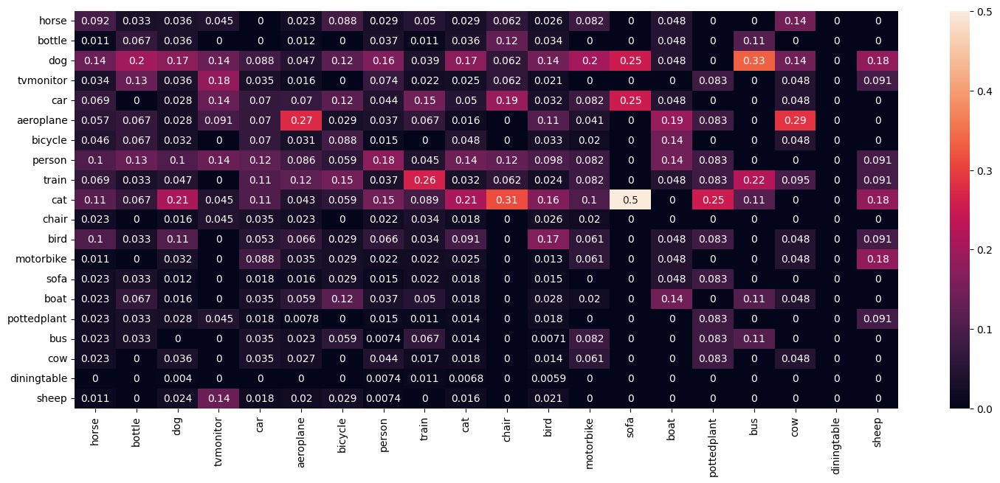

In [ ]:
result = confusion_matrix(org_labels_cat.argmax(axis=1), pred_labels_cat.argmax(axis=1), normalize='pred')
df_cm = pd.DataFrame(result, index=list(label_dict.keys()), columns=list(label_dict.keys()))
plt.figure(figsize = (18,7))
sns.heatmap(df_cm, annot=True)

## Visualizing some of the predictions made by CNN Model

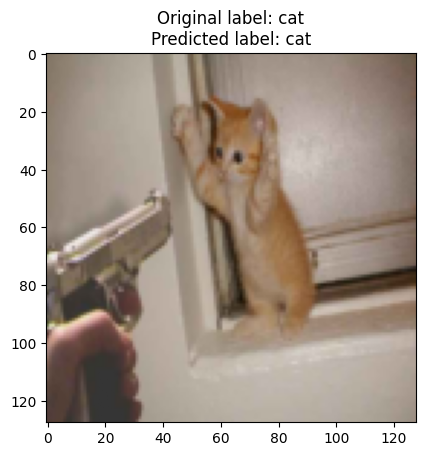

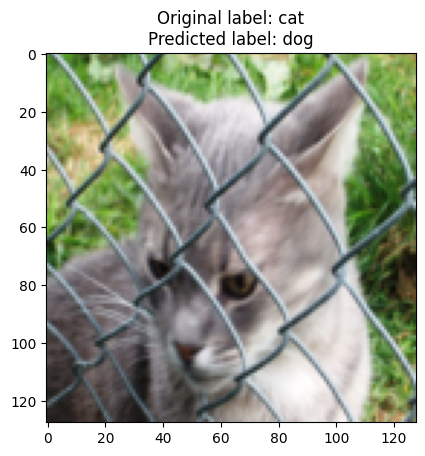

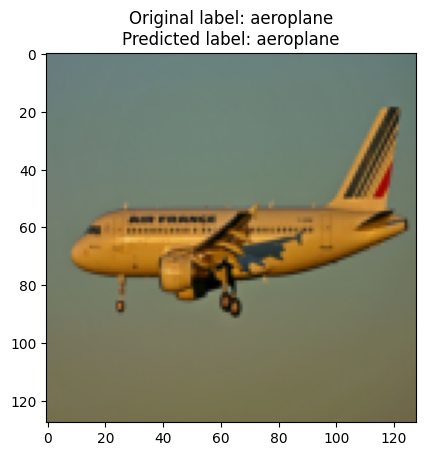

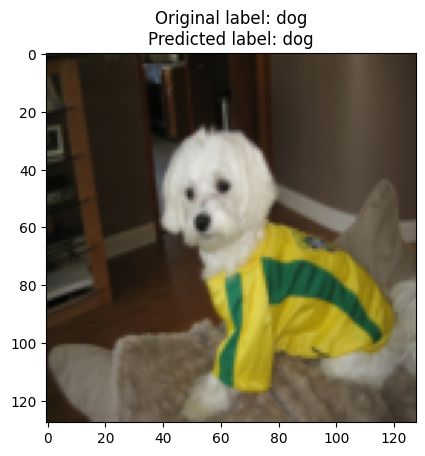

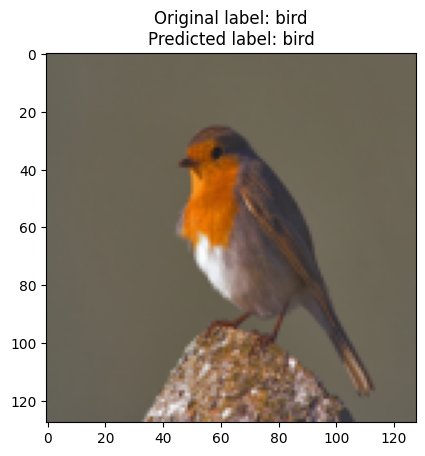

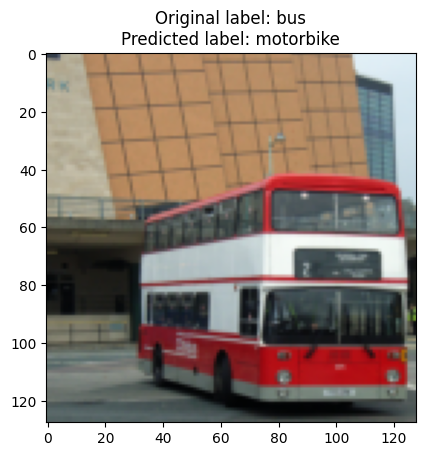

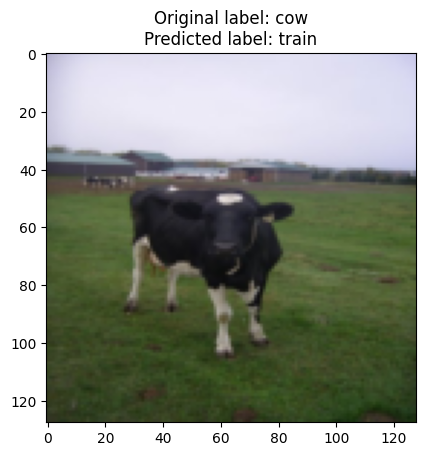

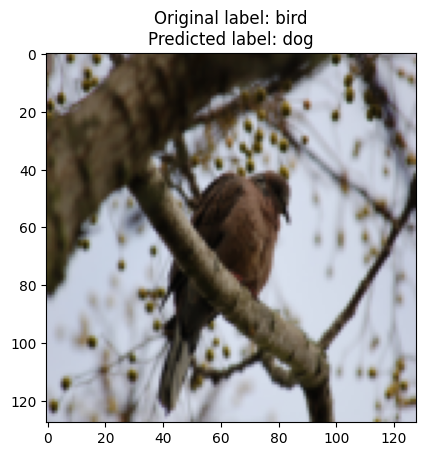

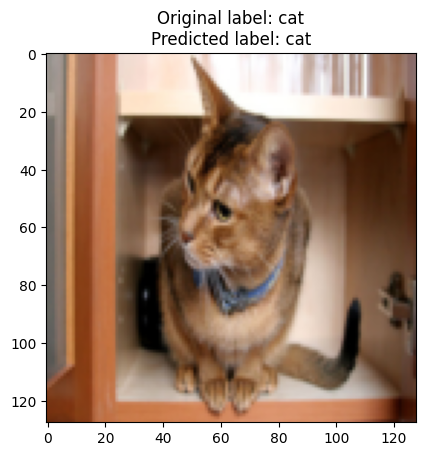

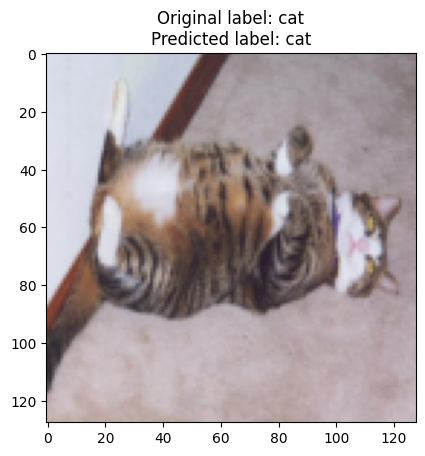

In [ ]:
for k in range(10):
    i = random.randint(0, len(images_all)-1)
    img = images_all[i]
    y_tru = target_dict[org_labels_all[i]]
    y_pre = target_dict[predictions_all[i]]
    plt.imshow(img)
    plt.title(f"Original label: {y_tru}\nPredicted label: {y_pre}")
    plt.show()

# YOLO

## Data Pre-Processing for YOLO model

In [ ]:
voc_images_path = 'voc_dataset/VOCdevkit/VOC2012/JPEGImages'  # Folder containing all VOC images
voc_annotations_path = 'voc_dataset/VOCdevkit/VOC2012/Annotations'  # Folder containing all XML annotations

# Define target paths
yolo_dataset_path = 'yolo_voc_dataset'
train_images_path = os.path.join(yolo_dataset_path, 'train', 'images')
train_labels_path = os.path.join(yolo_dataset_path, 'train', 'labels')
val_images_path = os.path.join(yolo_dataset_path, 'val', 'images')
val_labels_path = os.path.join(yolo_dataset_path, 'val', 'labels')

# Create folders
os.makedirs(train_images_path, exist_ok=True)
os.makedirs(train_labels_path, exist_ok=True)
os.makedirs(val_images_path, exist_ok=True)
os.makedirs(val_labels_path, exist_ok=True)

# Label map as in your provided example
label_dict = {
    'horse': 0,
    'bottle': 1,
    'dog': 2,
    'tvmonitor': 3,
    'car': 4,
    'aeroplane': 5,
    'bicycle': 6,
    'person': 7,
    'train': 8,
    'cat': 9,
    'chair': 10,
    'bird': 11,
    'motorbike': 12,
    'sofa': 13,
    'boat': 14,
    'pottedplant': 15,
    'bus': 16,
    'cow': 17,
    'diningtable': 18,
    'sheep': 19
}

# Function to convert VOC XML to YOLO TXT format
def convert_voc_to_yolo(voc_annotation_file, img_width, img_height):
    with open(voc_annotation_file) as f:
        tree = ET.parse(f)
    root = tree.getroot()

    yolo_annotations = []
    for obj in root.findall('object'):
        class_name = obj.find('name').text
        if class_name not in label_dict:
            continue
        class_id = label_dict[class_name]

        # Get bounding box and convert to YOLO format
        bndbox = obj.find('bndbox')
        xmin = float(bndbox.find('xmin').text)
        ymin = float(bndbox.find('ymin').text)
        xmax = float(bndbox.find('xmax').text)
        ymax = float(bndbox.find('ymax').text)

        # Normalize the coordinates
        x_center = ((xmin + xmax) / 2) / img_width
        y_center = ((ymin + ymax) / 2) / img_height
        width = (xmax - xmin) / img_width
        height = (ymax - ymin) / img_height

        yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

    return yolo_annotations

# Get list of all images and split into train/val sets
all_images = [f for f in os.listdir(voc_images_path) if f.endswith('.jpg')]
train_images, val_images = train_test_split(all_images, test_size=0.2, random_state=42)

# Process images and annotations
for image_set, images, images_path, labels_path in [
    ('train', train_images, train_images_path, train_labels_path),
    ('val', val_images, val_images_path, val_labels_path)
]:
    for img_name in images:
        # Copy image to the destination folder
        img_src_path = os.path.join(voc_images_path, img_name)
        img_dest_path = os.path.join(images_path, img_name)
        shutil.copy(img_src_path, img_dest_path)

        # Process annotation
        annotation_name = img_name.replace('.jpg', '.xml')
        annotation_path = os.path.join(voc_annotations_path, annotation_name)
        if not os.path.exists(annotation_path):
            continue  # Skip if no annotation file is found

        # Parse the image size from the XML annotation
        tree = ET.parse(annotation_path)
        root = tree.getroot()
        img_width = int(root.find('size').find('width').text)
        img_height = int(root.find('size').find('height').text)

        # Convert and save YOLO-formatted annotations
        yolo_annotations = convert_voc_to_yolo(annotation_path, img_width, img_height)
        label_file_path = os.path.join(labels_path, img_name.replace('.jpg', '.txt'))
        with open(label_file_path, 'w') as label_file:
            label_file.write('\n'.join(yolo_annotations))

# Create the YAML configuration file for YOLO
data_config = {
    'train': os.path.abspath(train_images_path),
    'val': os.path.abspath(val_images_path),
    'nc': len(label_dict),
    'names': list(label_dict.keys())
}

# Save YAML file
with open(os.path.join(yolo_dataset_path, 'voc_dataset.yaml'), 'w') as yaml_file:
    yaml.dump(data_config, yaml_file)

print("Dataset prepared for YOLO training.")

Dataset prepared for YOLO training.


## Initiating YOLO model

In [ ]:
model = YOLO("yolov8s.pt")

100%|██████████| 21.5M/21.5M [00:01<00:00, 16.3MB/s]


In [ ]:
model.to('cuda')

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(96, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_s

## Trainig YOLO model

In [ ]:
history = model.train(data='yolo_voc_dataset/voc_dataset.yaml', epochs=10, batch=32)

engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=yolo_voc_dataset/voc_dataset.yaml, epochs=10, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=cuda:0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=False, 

100%|██████████| 755k/755k [00:00<00:00, 3.12MB/s]


Overriding model.yaml nc=80 with nc=20

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 16.4MB/s]


AMP: checks passed ✅


train: Scanning /content/yolo_voc_dataset/train/labels... 13700 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13700/13700 [00:07<00:00, 1897.92it/s]


train: New cache created: /content/yolo_voc_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolo_voc_dataset/val/labels... 3425 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3425/3425 [00:05<00:00, 651.25it/s] 


val: New cache created: /content/yolo_voc_dataset/val/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      7.48G     0.8993      2.116      1.198          4        640: 100%|██████████| 429/429 [05:10<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:38<00:00,  1.41it/s]


                   all       3425       7843      0.591       0.56      0.573      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      7.43G       1.02      1.403      1.297          5        640: 100%|██████████| 429/429 [05:10<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:39<00:00,  1.35it/s]


                   all       3425       7843      0.594      0.551       0.57      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      7.42G      1.053      1.394      1.326          9        640: 100%|██████████| 429/429 [04:56<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:35<00:00,  1.53it/s]


                   all       3425       7843      0.584      0.491      0.519      0.358

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       7.5G      1.058      1.362      1.336         12        640: 100%|██████████| 429/429 [04:50<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:34<00:00,  1.56it/s]


                   all       3425       7843      0.614      0.529      0.561      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.72G      1.003      1.248      1.293          7        640: 100%|██████████| 429/429 [04:50<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:35<00:00,  1.53it/s]


                   all       3425       7843      0.646      0.568      0.606      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      7.81G     0.9531      1.127      1.255         12        640: 100%|██████████| 429/429 [04:59<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:37<00:00,  1.46it/s]


                   all       3425       7843      0.628      0.587      0.624      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      7.77G     0.9013      1.033      1.217         15        640: 100%|██████████| 429/429 [04:49<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:35<00:00,  1.54it/s]


                   all       3425       7843      0.687      0.618      0.663      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      7.73G      0.858     0.9405      1.186          4        640: 100%|██████████| 429/429 [04:52<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:35<00:00,  1.53it/s]


                   all       3425       7843       0.72      0.621      0.684      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       7.7G     0.8131     0.8511      1.148          9        640: 100%|██████████| 429/429 [04:52<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:34<00:00,  1.58it/s]


                   all       3425       7843      0.705      0.643      0.703      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      7.76G     0.7778     0.7789      1.118         37        640: 100%|██████████| 429/429 [04:52<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:35<00:00,  1.53it/s]


                   all       3425       7843      0.719       0.66      0.717       0.55

10 epochs completed in 0.930 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,133,324 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:40<00:00,  1.32it/s]


                   all       3425       7843      0.719      0.659      0.717       0.55
                 horse        100        153      0.564      0.617      0.647      0.502
                bottle        173        325      0.665      0.505      0.552      0.373
                   dog        271        319      0.754      0.796      0.855      0.701
             tvmonitor        125        150      0.657       0.72      0.761      0.576
                   car        258        495      0.765      0.663      0.756      0.578
             aeroplane        133        193      0.894      0.782      0.843      0.678
               bicycle        108        154      0.647      0.649       0.71      0.552
                person       1885       3385      0.772      0.774      0.819      0.635
                 train        114        132      0.889      0.818      0.901      0.719
                   cat        240        273      0.809      0.868      0.904       0.77
                 chai

## Analyzing training history for YOLO model

In [ ]:
results = history.results_dict

precision = results['metrics/precision(B)']
recall = results['metrics/recall(B)']
mAP50 = results['metrics/mAP50(B)']
mAP50_95 = results['metrics/mAP50-95(B)']

class_maps = history.maps
class_names = history.names

# Print class-specific mAP values for reference
for class_id, class_name in class_names.items():
    print(f"{class_name}: {class_maps[class_id]}")

horse: 0.5015931391997566
bottle: 0.372636987840518
dog: 0.7006060910882228
tvmonitor: 0.5764382151737534
car: 0.5782145675101094
aeroplane: 0.6780814341234505
bicycle: 0.5524618481697249
person: 0.6353688132411992
train: 0.7188926201089808
cat: 0.7697542125486253
chair: 0.4077708918484889
bird: 0.6136046452782538
motorbike: 0.4708269828444033
sofa: 0.441337186123617
boat: 0.3681739280983396
pottedplant: 0.2950689615652206
bus: 0.641699011281317
cow: 0.5850460698292578
diningtable: 0.4656838865196871
sheep: 0.6303061691517672


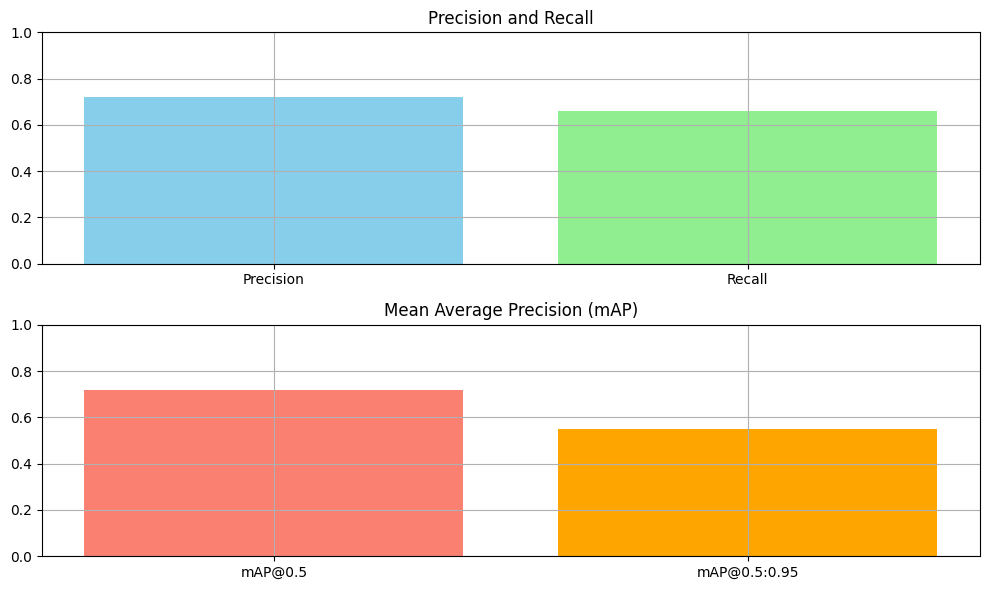

In [ ]:
# Plotting the overall metrics
plt.figure(figsize=(10, 6))

# Precision and Recall
plt.subplot(2, 1, 1)
plt.bar(['Precision', 'Recall'], [precision, recall], color=['skyblue', 'lightgreen'])
plt.title('Precision and Recall')
plt.grid()
plt.ylim(0, 1)

# mAP@0.5 and mAP@0.5:0.95
plt.subplot(2, 1, 2)
plt.bar(['mAP@0.5', 'mAP@0.5:0.95'], [mAP50, mAP50_95], color=['salmon', 'orange'])
plt.title('Mean Average Precision (mAP)')
plt.ylim(0, 1)
plt.grid()

plt.tight_layout()
plt.show()

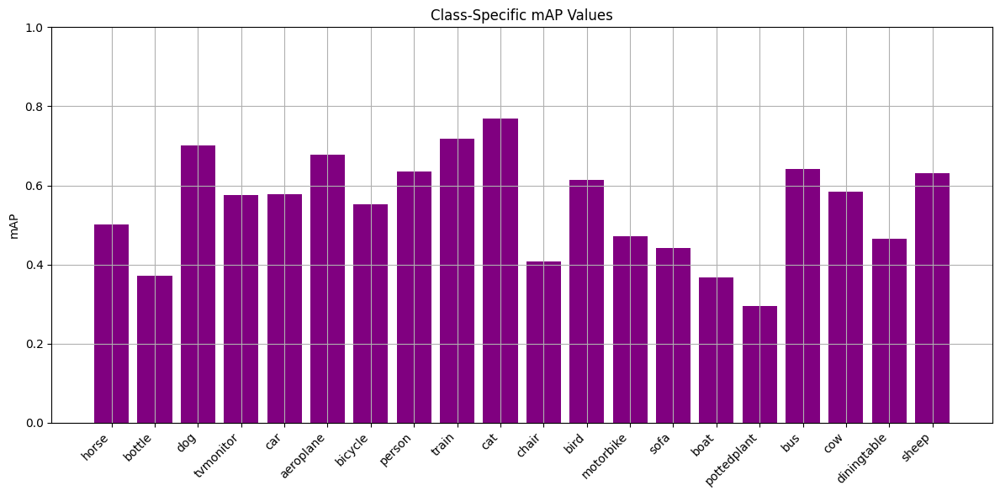

In [ ]:
plt.figure(figsize=(12, 6))
plt.bar(class_names.values(), class_maps, color='purple')
plt.xticks(rotation=45, ha='right')
plt.title('Class-Specific mAP Values')
plt.ylabel('mAP')
plt.ylim(0, 1)
plt.tight_layout()
plt.grid()
plt.show()

## Saving YOLO Model for for future use

The YOLO model by default save in directory /content/runs/detect/train/weights as "best.pt"

## Loading back the YOLO model (if not re-training)

In [ ]:
model = YOLO("myYOLOmodel.pt")

## Analyzing results metrics for YOLO model

In [ ]:
image_dir = 'yolo_voc_dataset/val/images'
label_dir = 'yolo_voc_dataset/val/labels'

y_true = []
y_pred = []
predictions = []

for image_name in os.listdir(image_dir):
    if image_name.endswith('.jpg') or image_name.endswith('.png'):

        image_path = os.path.join(image_dir, image_name)
        label_path = os.path.join(label_dir, image_name.replace('.jpg', '.txt'))

        if os.path.exists(label_path):
            with open(label_path, 'r') as file:
                ground_truth_labels = [int(line.split()[0]) for line in file]
        else:
            ground_truth_labels = []

        results = model.predict(image_path)[0]

        if results and results.boxes is not None:

            predicted_classes = [int(box.cls) for box in results.boxes]

            if len(predicted_classes) > 0:
                y_true.append(ground_truth_labels)
                y_pred.append(predicted_classes)
                predictions.append(results)
        else:

            print(f"No predictions for image: {image_name}")

Streaming output truncated to the last 5000 lines.
Speed: 6.1ms preprocess, 16.9ms inference, 3.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/yolo_voc_dataset/val/images/2011_005903.jpg: 480x640 6 persons, 16.6ms
Speed: 4.6ms preprocess, 16.6ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/yolo_voc_dataset/val/images/2008_007317.jpg: 480x640 1 bird, 13.9ms
Speed: 3.4ms preprocess, 13.9ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/yolo_voc_dataset/val/images/2011_003452.jpg: 640x480 2 persons, 15.9ms
Speed: 3.5ms preprocess, 15.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/yolo_voc_dataset/val/images/2010_006015.jpg: 480x640 3 chairs, 1 diningtable, 13.8ms
Speed: 3.8ms preprocess, 13.8ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/yolo_voc_dataset/val/images/2009_005154.jpg: 480x640 2 cars, 1 bicycl

In [ ]:
mlb = MultiLabelBinarizer()

In [ ]:
y_true_encoded = mlb.fit_transform(y_true)
y_pred_encoded = mlb.fit_transform(y_pred)

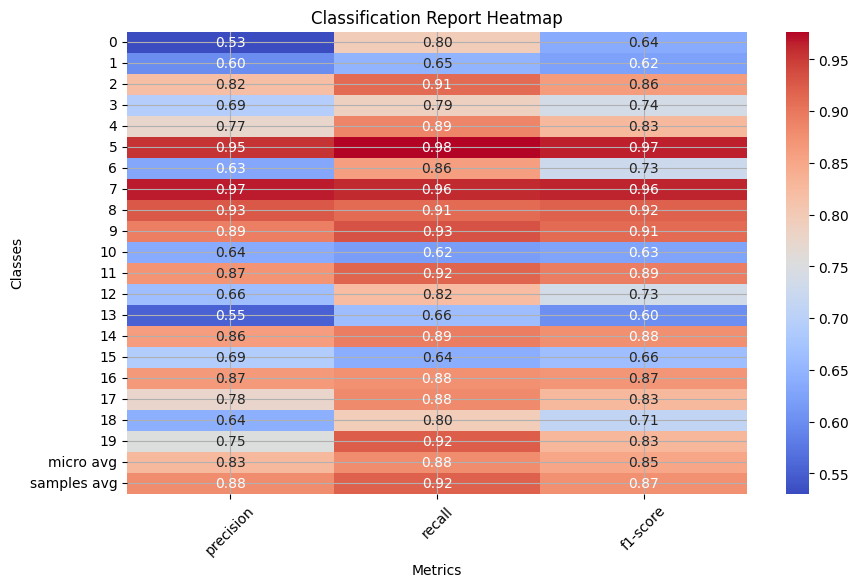

In [ ]:
cr = classification_report(y_true_encoded, y_pred_encoded,  output_dict=True)

report_df = pd.DataFrame(cr).transpose()

report_df = report_df.drop(['macro avg', 'weighted avg'])

plt.figure(figsize=(10, 6))
sns.heatmap(report_df[['precision', 'recall', 'f1-score']], annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title('Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.xticks(rotation=45)
plt.grid()
plt.yticks(rotation=0)
plt.show()

<Axes: >

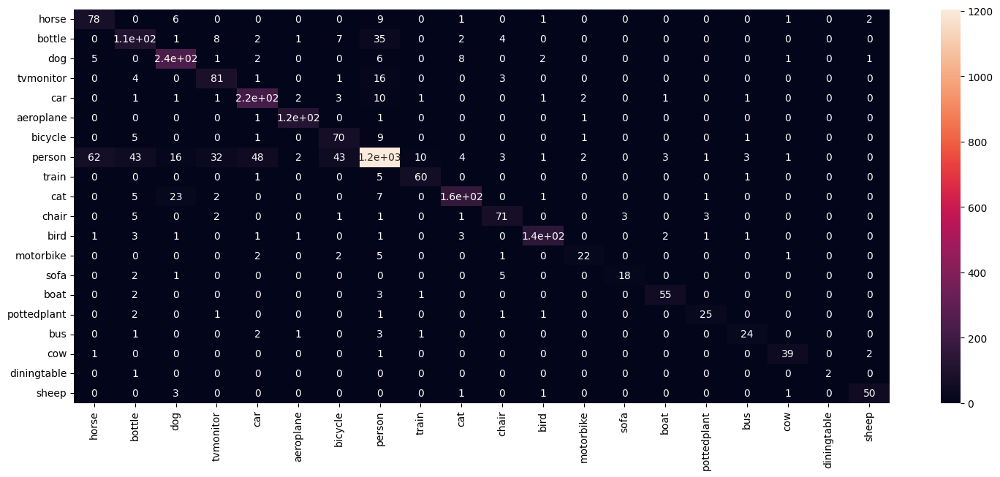

In [ ]:
result = confusion_matrix(y_true_encoded.argmax(axis=1), y_pred_encoded.argmax(axis=1))

df_cm = pd.DataFrame(result, index=list(label_dict.keys()), columns=list(label_dict.keys()))
plt.figure(figsize = (18,7))
sns.heatmap(df_cm, annot=True)

In [ ]:
accuracy = accuracy_score(y_true_encoded, y_pred_encoded)
hamming = hamming_loss(y_true_encoded, y_pred_encoded)

precision = precision_score(y_true_encoded, y_pred_encoded, average='micro')
recall = recall_score(y_true_encoded, y_pred_encoded, average='micro')

print(f"Accuracy: {accuracy}")
print(f"Hamming Loss: {hamming}")
print(f"Precision (micro average): {precision}")
print(f"Recall (micro average): {recall}")

Accuracy: 0.6757638682883418
Hamming Loss: 0.021106496588549392
Precision (micro average): 0.8258928571428571
Recall (micro average): 0.8781014023732471


In [ ]:
img_path = "/content/voc_dataset/VOCdevkit/VOC2012/JPEGImages/2007_000027.jpg"

start_time = time.time()

results = model.predict(img_path)[0]

inference_time = time.time() - start_time

speed_info = results.speed

print(f"Inference time: {inference_time:.4f} seconds")
print(f"Preprocess time: {speed_info['preprocess']:.4f} seconds")
print(f"Inference time: {speed_info['inference']:.4f} seconds")
print(f"Postprocess time: {speed_info['postprocess']:.4f} seconds")


image 1/1 /content/voc_dataset/VOCdevkit/VOC2012/JPEGImages/2007_000027.jpg: 640x640 1 person, 11.6ms
Speed: 24.3ms preprocess, 11.6ms inference, 1571.5ms postprocess per image at shape (1, 3, 640, 640)
Inference time: 3.4533 seconds
Preprocess time: 24.2987 seconds
Inference time: 11.5628 seconds
Postprocess time: 1571.4707 seconds


In [ ]:
model_size = os.path.getsize("/content/runs/detect/train/weights/best.pt")

# Convert size to MB (1 MB = 1024 * 1024 bytes)
model_size_mb = model_size / (1024 * 1024)

# Print the size of the model
print(f"The size of the model is: {model_size_mb:.2f} MB")

The size of the model is: 21.47 MB


## Visualizing some of the predictions made by YOLO Model

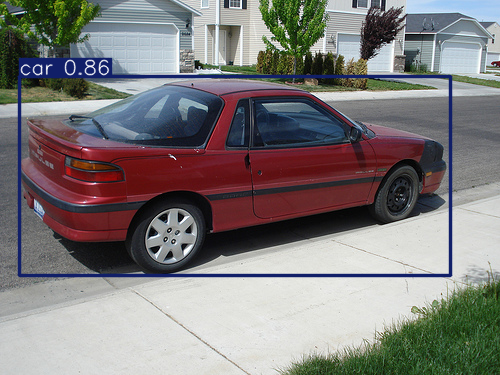

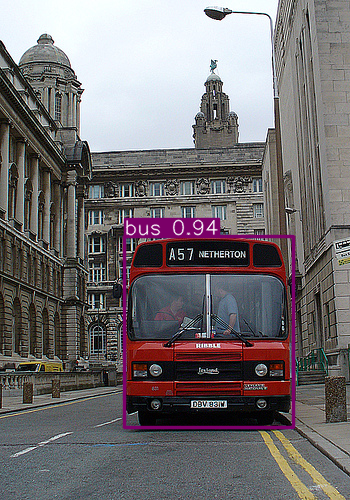

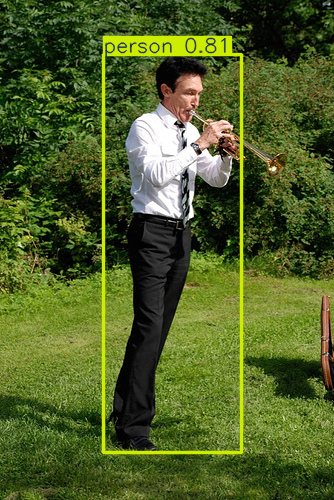

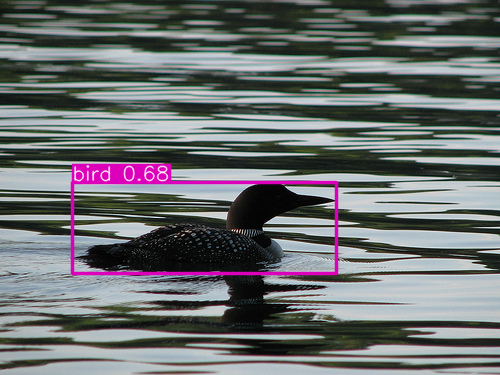

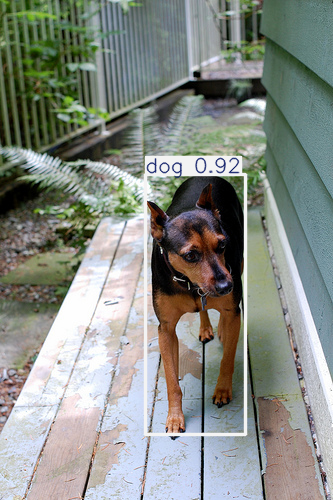

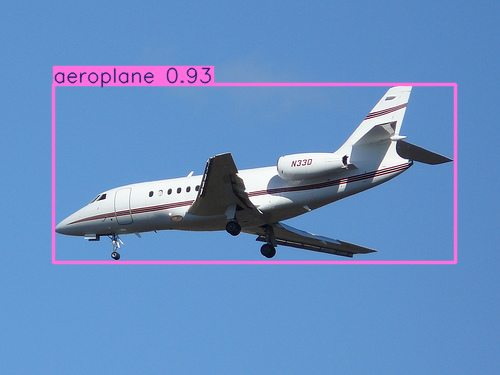

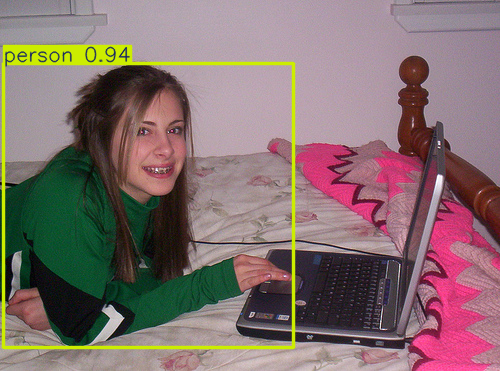

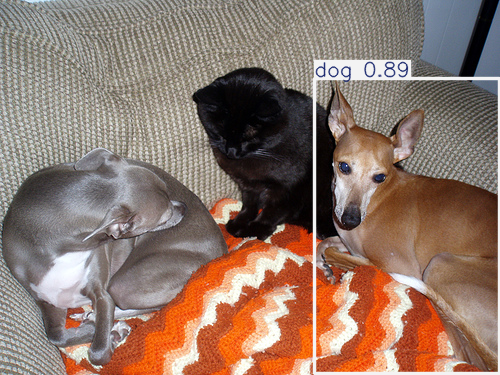

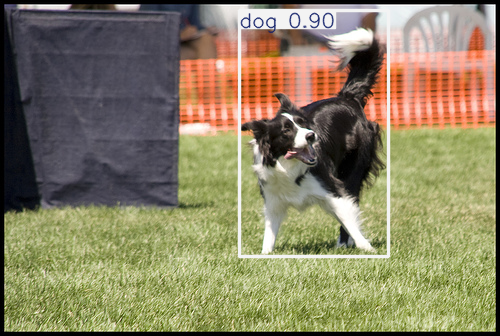

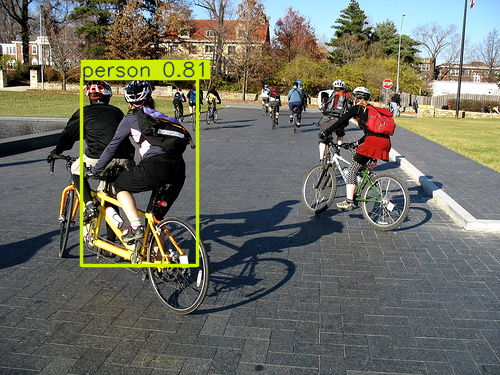

In [ ]:
for k in range(0, 10):
    i = random.randint(0, len(predictions)-1)
    predictions[i][0].show()

# R-CNN

## Initiating R-CNN Model

In [ ]:
# Set device to CUDA if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

num_classes = 20  # Adjust based on your label_dict
model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Optimizer and learning rate scheduler
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

model.to(device)

## Training R-CNN Model

In [ ]:
# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, targets in tqdm(train_loader):

        # Ensure images are in the correct shape (C, H, W)
        images = [img.permute(2, 0, 1).float() for img in images]  # Convert (H, W, C) to (C, H, W)

        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    # Step the learning rate scheduler
    lr_scheduler.step()

100%|██████████| 714/714 [03:13<00:00,  3.68it/s]


## Saving R-CNN Model for for future use

In [ ]:
torch.save(model, 'MyRCNNModel.pl')

## Loading Back The R-CNN Model (if not re-training)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

try:
    model = torch.load("MyRCNNModel.pl")
except:
    model = torch.load("MyRCNNModel.pl", map_location=torch.device('cpu'))

model.to(device)

## Analyzing results metrics for R-CNN model

In [ ]:
model.eval()

In [ ]:
# Initialize lists to store ground truth and predicted results
all_pred_boxes = []
all_pred_labels = []
all_pred_scores = []
all_true_boxes = []
all_true_labels = []

In [ ]:
for images, targets in tqdm(test_loader):
    # Move images and targets to the appropriate device
    images = [image.to(device) for image in images]
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    with torch.no_grad():
        # Get predictions from the model
        images = [img.permute(2, 0, 1).float() for img in images]
        predictions = model(images)

    # Process predictions
    for prediction, target in zip(predictions, targets):
        pred_boxes = prediction['boxes']
        pred_labels = prediction['labels']
        pred_scores = prediction['scores']

        true_boxes = target['boxes']
        true_labels = target['labels']

        # Append predictions and ground truths
        all_pred_boxes.append(pred_boxes)
        all_pred_labels.append(pred_labels)
        all_pred_scores.append(pred_scores)
        all_true_boxes.append(true_boxes)
        all_true_labels.append(true_labels)

100%|██████████| 727/727 [01:50<00:00,  6.60it/s]


## Visualizing some of the predictions made by R-CNN model

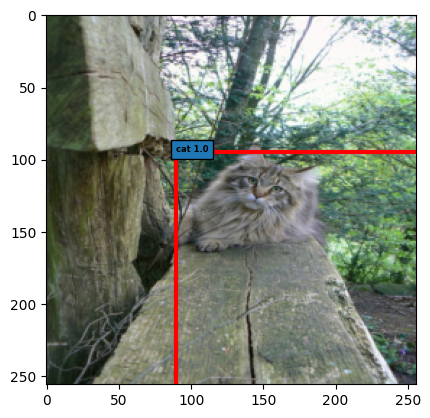

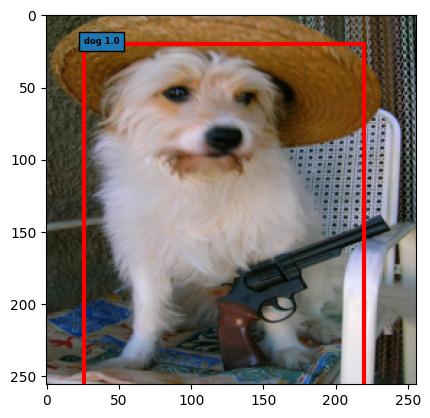

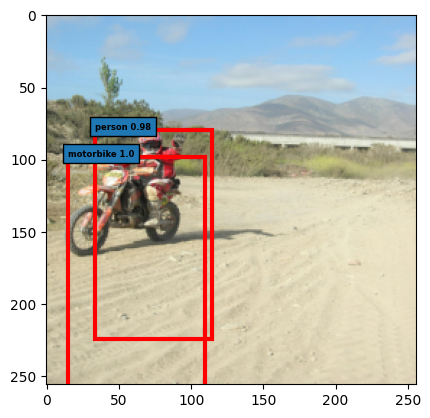

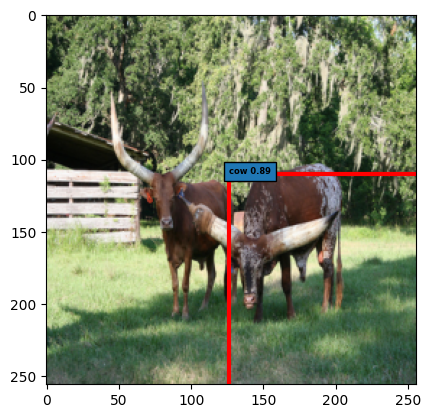

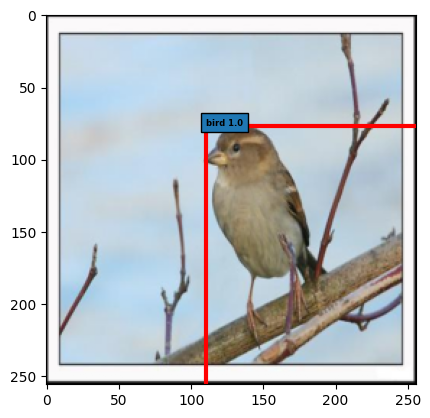

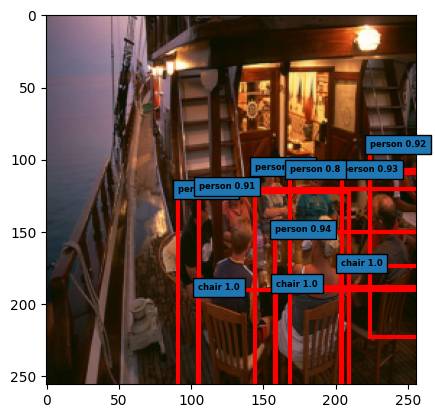

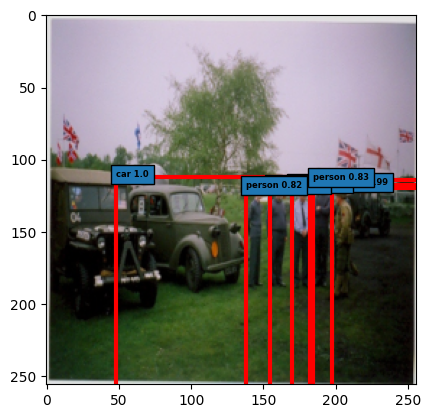

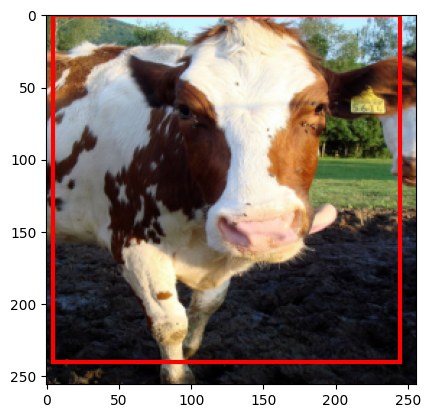

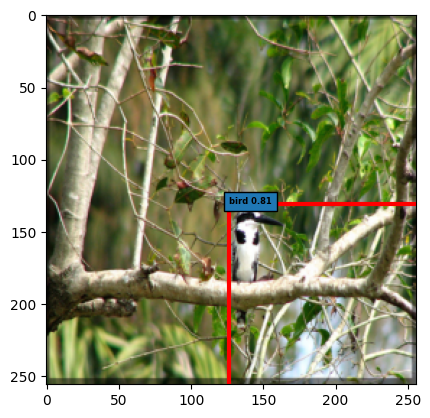

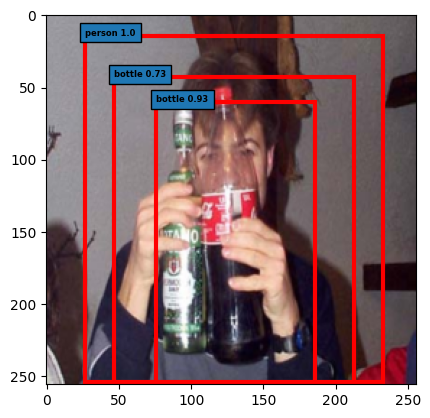

In [ ]:
for m in range(10):

    rn = random.randint(0, len(all_true_labels)-1)

    imag = torch.stack([test_dataset[rn][0]])
    imag = np.transpose(imag, (0, 2, 3, 1))

    fig, ax = plt.subplots()

    trgt_boxes = all_pred_boxes[rn]
    trgt_lbls = [target_dict[i.item()] for i in all_pred_labels[rn]]
    all_pred_sc = all_pred_scores[rn]

    ax.imshow(imag[0])

    for k in range(len(trgt_boxes)):
        if all_pred_sc[k] > 0.7:

            bx = trgt_boxes[k]
            bx = bx.cpu()

            if bx[2] < 240:
                bxw = bx[2]
            else:
                bxw = 240
            if bx[3] < 240:
                bxh = bx[3]
            else:
                bxh = 240


            rect = patches.Rectangle((bx[0], bx[1]), bxw, bxh, linewidth=3, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.annotate(f"{trgt_lbls[k]} {round(all_pred_sc[k].item(), 2)}", (bx[0], bx[1]-5), color='black', weight='bold',
                        fontsize=6, ha='left', va='top', bbox=dict(boxstyle='square,pad=.6'))
    plt.show()

In [ ]:
metric = MeanAveragePrecision(iou_thresholds=[0.5], class_metrics=True)

In [ ]:
metric.to(device)

MeanAveragePrecision()

In [ ]:
predictions = [
    {"boxes": pred_box.cpu(), "scores": pred_score.cpu(), "labels": pred_label.cpu()}
    for pred_box, pred_score, pred_label in zip(all_pred_boxes, all_pred_scores, all_pred_labels)
]

targets = [
    {"boxes": true_box.cpu(), "labels": true_label.cpu()}
    for true_box, true_label in zip(all_true_boxes, all_true_labels)
]

In [ ]:
metric.update(predictions, targets)

In [ ]:
results = metric.compute()
print(f'mAP: {results["map_50"]:.4f}')
print(f'Precision: {results["map_per_class"]}')
print(f'Recall: {results["mar_100"]:.4f}')

mAP: 0.6123
Precision: tensor([0.0000, 0.4071, 0.7581, 0.6583, 0.6601, 0.7488, 0.7215, 0.7362, 0.7996, 0.8406, 0.4524, 0.6200, 0.7624, 0.5953, 0.4755, 0.4037, 0.7680, 0.6067, 0.5819, 0.6505])
Recall: 0.7187


In [ ]:
results

{'map': tensor(0.6123),
 'map_50': tensor(0.6123),
 'map_75': tensor(-1.),
 'map_small': tensor(0.1891),
 'map_medium': tensor(0.5579),
 'map_large': tensor(0.7619),
 'mar_1': tensor(0.5097),
 'mar_10': tensor(0.7090),
 'mar_100': tensor(0.7187),
 'mar_small': tensor(0.3373),
 'mar_medium': tensor(0.6898),
 'mar_large': tensor(0.8394),
 'map_per_class': tensor([0.0000, 0.4071, 0.7581, 0.6583, 0.6601, 0.7488, 0.7215, 0.7362, 0.7996, 0.8406, 0.4524, 0.6200, 0.7624, 0.5953, 0.4755, 0.4037, 0.7680, 0.6067, 0.5819, 0.6505]),
 'mar_100_per_class': tensor([0.0000, 0.5364, 0.8820, 0.7271, 0.7491, 0.7826, 0.7836, 0.8189, 0.8410, 0.8916, 0.6508, 0.6884, 0.8457, 0.8109, 0.6701, 0.6255, 0.8031, 0.7896, 0.7212, 0.7567]),
 'classes': tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], dtype=torch.int32)}

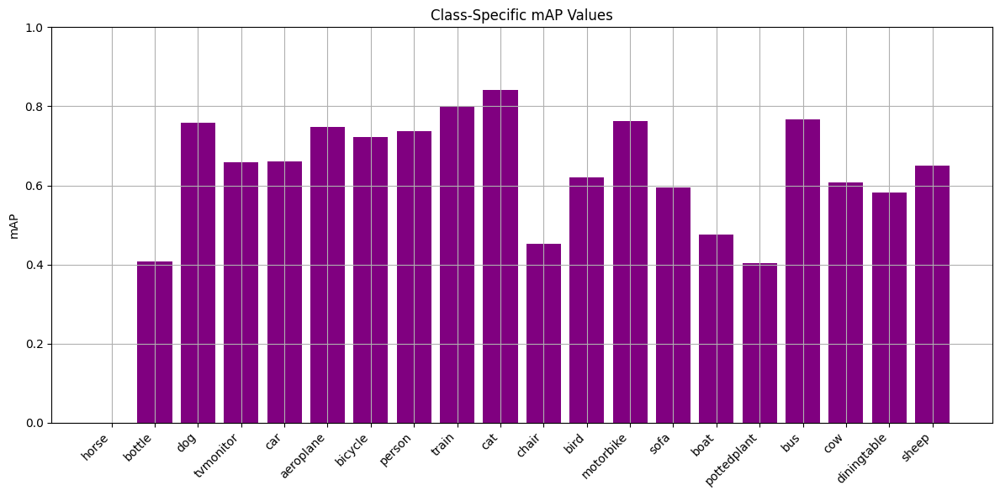

In [ ]:
plt.figure(figsize=(12, 6))
plt.bar(target_dict.values(), np.array(results["map_per_class"].cpu()), color='purple')
plt.xticks(rotation=45, ha='right')
plt.title('Class-Specific mAP Values')
plt.ylabel('mAP')
plt.ylim(0, 1)
plt.tight_layout()
plt.grid()
plt.show()

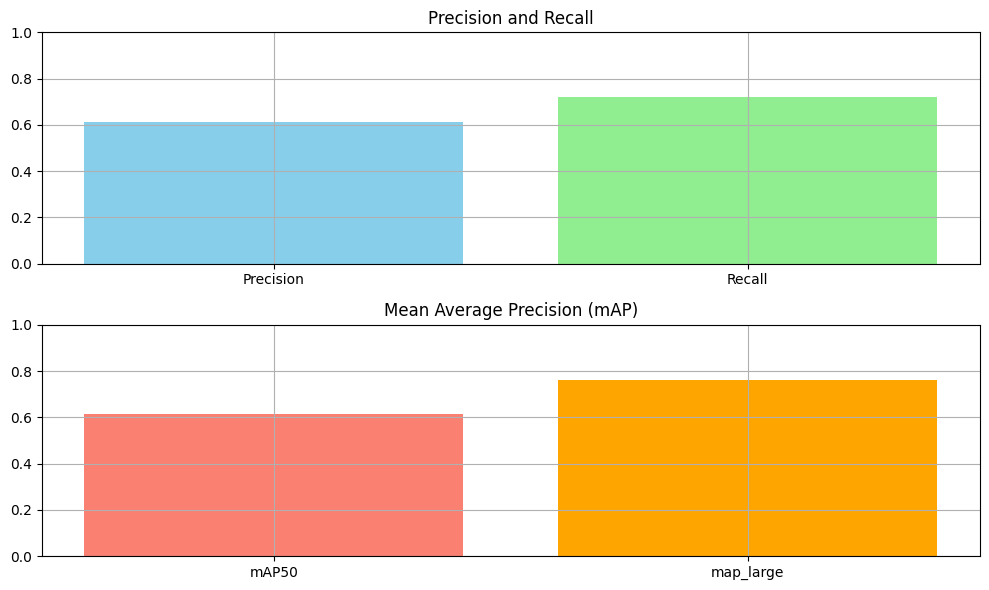

In [ ]:
plt.figure(figsize=(10, 6))

# Precision and Recall
plt.subplot(2, 1, 1)
plt.bar(['Precision', 'Recall'], [np.array(results["map_per_class"].cpu()).mean(), results["mar_100"].cpu()], color=['skyblue', 'lightgreen'])
plt.title('Precision and Recall')
plt.grid()
plt.ylim(0, 1)

# mAP@0.5 and mAP@0.5:0.95
plt.subplot(2, 1, 2)
plt.bar(['mAP50', 'map_large'], [results['map_50'], results['map_large']], color=['salmon', 'orange'])
plt.title('Mean Average Precision (mAP)')
plt.ylim(0, 1)
plt.grid()

plt.tight_layout()
plt.show()

In [ ]:
for images, targets in test_loader:
    # Move images and targets to the appropriate device
    images = [image.to(device) for image in images]
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    with torch.no_grad():
        # Get predictions from the model
        images = [img.permute(2, 0, 1).float() for img in images]
        st = time.time()
        predictions = model(images)
        et = time.time()
    break

inference_time = et - st

print(f"Inference time: {inference_time:.4f} seconds")

Inference time: 0.2462 seconds


In [ ]:
model_size = os.path.getsize("/content/MyRCNNModel.pl")

# Convert size to MB (1 MB = 1024 * 1024 bytes)
model_size_mb = model_size / (1024 * 1024)

# Print the size of the model
print(f"The size of the model is: {model_size_mb:.2f} MB")

The size of the model is: 72.90 MB


In [ ]:
 %shell jupyter nbconvert --to html /content/Object_Detection_Project.ipynb

[NbConvertApp] Converting notebook /content/Object_Detection_Project.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 51 image(s).
[NbConvertApp] Writing 15014005 bytes to /content/Object_Detection_Project.html
